In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from seaborn import set_style

set_style('whitegrid')
pd.set_option('display.max_columns', None) #forces all columns to be displayed
#pd.set_option('display.max_rows', None) #forces all rows to be displayed

In [ ]:
%run ../data/features.py

In [22]:
filepath = '../data/national-data-master.csv'
national_data = pd.read_csv(filepath)
train_filepath = '../data/data-full-train.csv'
train_data = pd.read_csv(train_filepath)

First, we run through some basic cleaning checks on the full dataset:

In [23]:
#index_columns and health_features are defined in ../data/features.py
df = national_data[index_columns + health_features] 

In [24]:
df.head()

,FIPS,State,County,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Drug Overdose Mortality Rate,Deaths,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Driving Deaths with Alcohol Involvement,Chlamydia Rate,Injury Death Rate,Age-Adjusted Death Rate,Child Mortality Rate,Infant Mortality Rate,% Frequent Physical Distress,% Frequent Mental Distress,HIV Prevalence Rate,Homicide Rate,Suicide Rate (Age-Adjusted),Firearm Fatalities Rate,Motor Vehicle Mortality Rate,Juvenile Arrest Rate,% Rural
0,1000,Alabama,NaN,13.3,40.6,73.707861,21.561302,98140.0,11415.734833,17.8,3.934735,5.869320,10.480008,25.126369,625.2,90.379699,548.756171,73.033842,7.730110,12.366651,19.578269,339.7,12.131184,16.234752,23.226340,20.588369,12.262097,42.262760
1,1001,Alabama,Autauga,10.7,38.9,75.263497,9.350765,942.0,9407.948438,17.3,3.910265,5.703204,9.871335,29.090909,577.0,68.033478,472.283923,58.562128,6.834686,11.700000,18.000000,218.0,6.616163,17.457479,17.362711,18.067215,4.838710,40.676813
2,1003,Alabama,Baldwin,9.8,37.2,76.738314,25.729422,3789.0,8981.575353,15.2,3.730943,5.373666,8.124318,36.144578,317.6,77.507985,416.218912,54.035005,5.329250,11.000000,17.300000,174.3,3.388203,18.790126,14.343432,15.833332,20.305677,37.586455
3,1005,Alabama,Barbour,15.6,43.4,72.377024,NaN,579.0,13138.848362,27.3,5.023488,6.014294,12.272491,31.428571,729.0,85.215853,628.253596,80.039130,NaN,15.800000,20.500000,513.7,13.005813,13.426810,26.529464,29.404447,NaN,65.919994
4,1007,Alabama,Bibb,12.4,39.6,72.251369,22.385721,501.0,12675.434581,22.0,4.552795,5.824583,9.828571,15.384615,662.9,99.933081,618.323859,100.872548,NaN,14.000000,19.400000,269.3,9.535858,17.050221,20.521972,24.793231,NaN,100.000000


In [25]:
df.isna().sum()

FIPS                                              0
State                                             0
County                                           51
% Adults with Diabetes                            7
% Adults with Obesity                             7
Life Expectancy                                  80
Drug Overdose Mortality Rate                   1251
Deaths                                          264
Years of Potential Life Lost Rate               264
% Fair or Poor Health                             7
Average Number of Physically Unhealthy Days       7
Average Number of Mentally Unhealthy Days         7
% Low Birthweight                               105
% Driving Deaths with Alcohol Involvement        34
Chlamydia Rate                                  153
Injury Death Rate                               113
Age-Adjusted Death Rate                          62
Child Mortality Rate                           1112
Infant Mortality Rate                          1944
% Frequent P

In [26]:
features_with_many_nulls = ['Drug Overdose Mortality Rate',
                            'Child Mortality Rate',
                            'Infant Mortality Rate',
                            #'HIV Prevalence Rate',
                            'Homicide Rate',
                            'Suicide Rate (Age-Adjusted)',
                            'Firearm Fatalities Rate',
                            'Motor Vehicle Mortality Rate',
                            'Juvenile Arrest Rate']

In [27]:
df.nunique()

FIPS                                           3201
State                                            51
County                                         1857
% Adults with Diabetes                          138
% Adults with Obesity                           271
Life Expectancy                                3120
Drug Overdose Mortality Rate                   1948
Deaths                                         1609
Years of Potential Life Lost Rate              2936
% Fair or Poor Health                           237
Average Number of Physically Unhealthy Days    3193
Average Number of Mentally Unhealthy Days      3193
% Low Birthweight                              2986
% Driving Deaths with Alcohol Involvement       911
Chlamydia Rate                                 2418
Injury Death Rate                              3085
Age-Adjusted Death Rate                        3138
Child Mortality Rate                           2083
Infant Mortality Rate                          1251
% Frequent P

In [28]:
df.nunique() + df.isna().sum()

FIPS                                           3201
State                                            51
County                                         1908
% Adults with Diabetes                          145
% Adults with Obesity                           278
Life Expectancy                                3200
Drug Overdose Mortality Rate                   3199
Deaths                                         1873
Years of Potential Life Lost Rate              3200
% Fair or Poor Health                           244
Average Number of Physically Unhealthy Days    3200
Average Number of Mentally Unhealthy Days      3200
% Low Birthweight                              3091
% Driving Deaths with Alcohol Involvement       945
Chlamydia Rate                                 2571
Injury Death Rate                              3198
Age-Adjusted Death Rate                        3200
Child Mortality Rate                           3195
Infant Mortality Rate                          3195
% Frequent P

In [29]:
df['% Adults with Diabetes'].max()

np.float64(22.2)

Several of the features have relatively few unique values. This is due to rounding of figures within a small range. '% Adults with Diabetes', for instance, has a maximum of 22.2 and a potential minimum of zero, and is only reported to the tenths place, leaving only 222 possible values to be reported.

Each row is unique; I believe the FIPS key guarantees that by definition.

### Here we examine scatter plots and histograms among health features on the training set:

In [37]:
train_data_health_features = train_data[health_features]

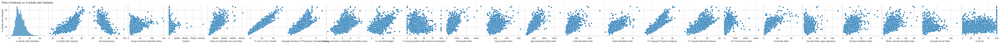

In [ ]:
#Using diabetes as the target
sns.pairplot(train_data_health_features, y_vars='% Adults with Diabetes')
plt.title('Plots of features vs % Adults with Diabetes')

plt.show()

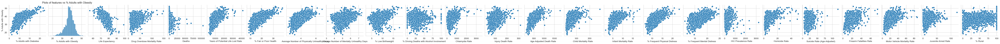

In [ ]:
#Using obesity as the target
sns.pairplot(train_data_health_features, y_vars='% Adults with Obesity')
plt.title('Plots of features vs % Adults with Obesity')

plt.show()

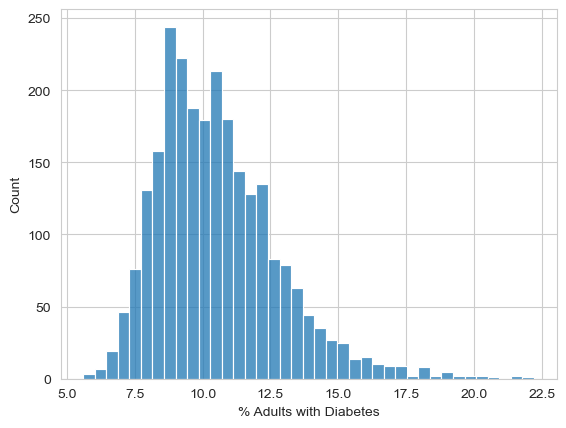

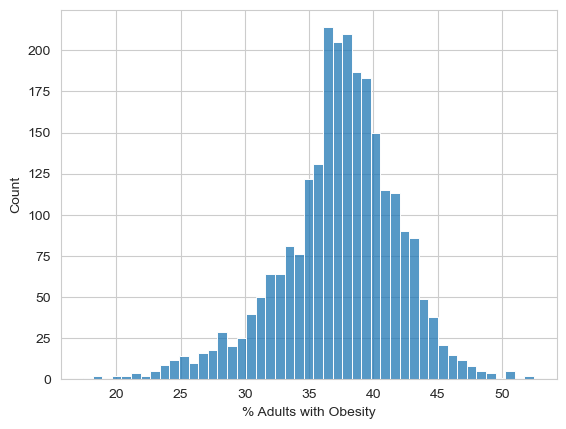

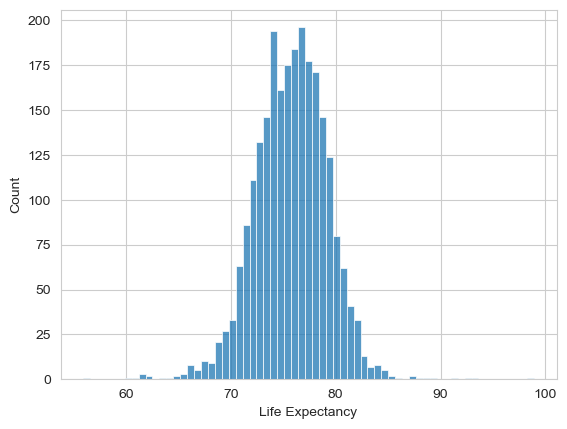

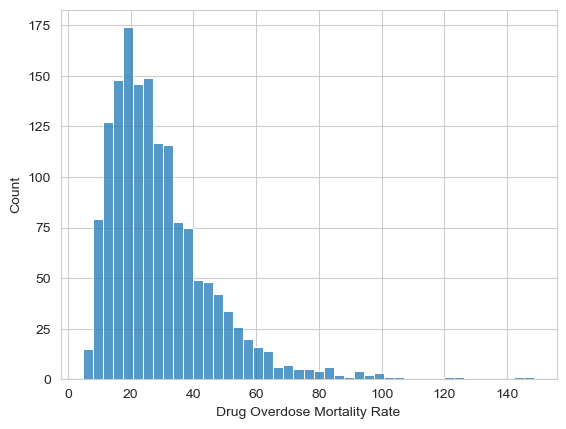

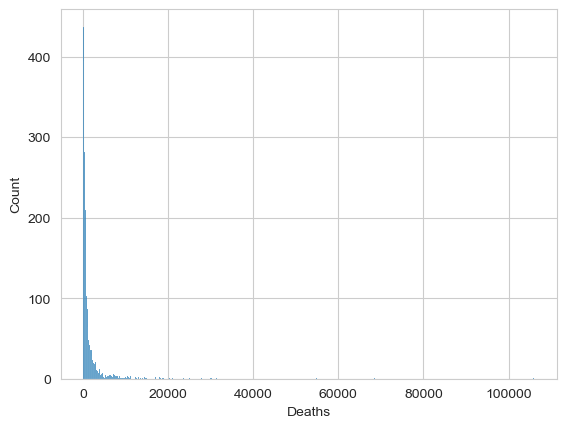

...

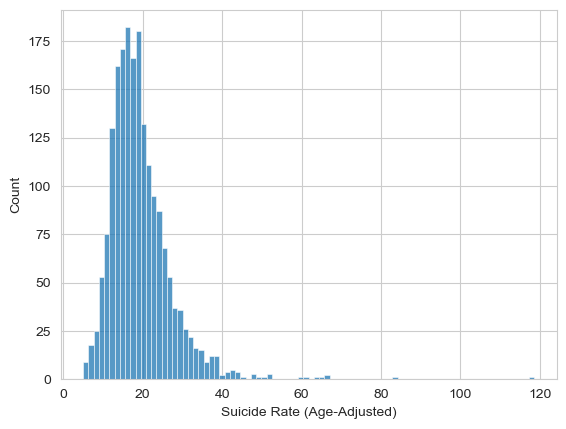

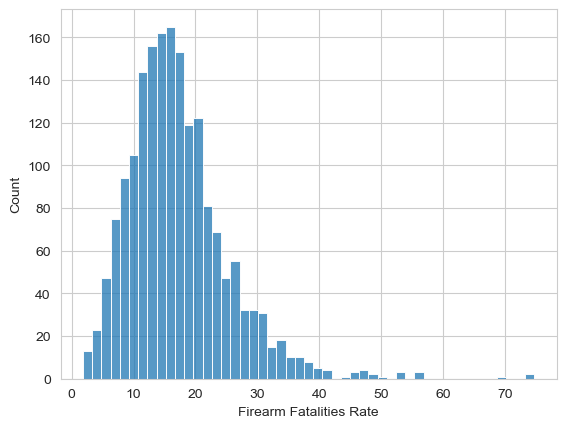

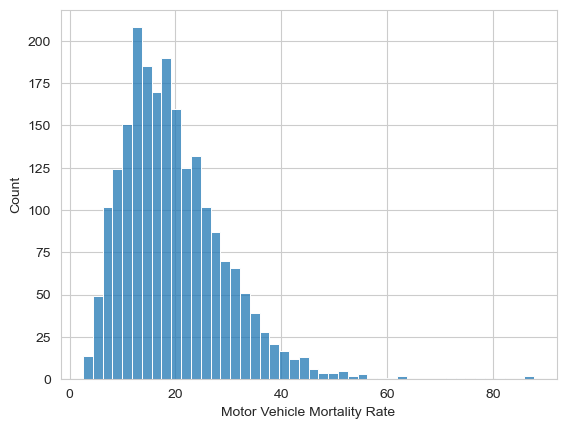

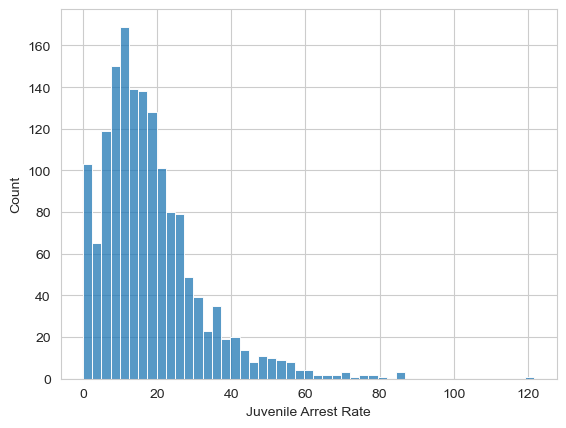

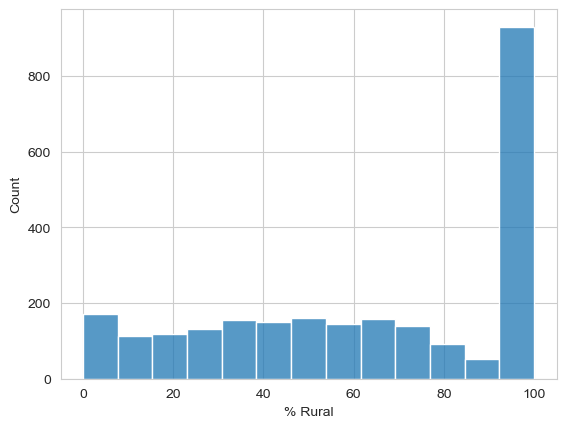

In [41]:
for column in train_data_health_features.columns:
    sns.histplot(train_data_health_features[column])
    plt.show()

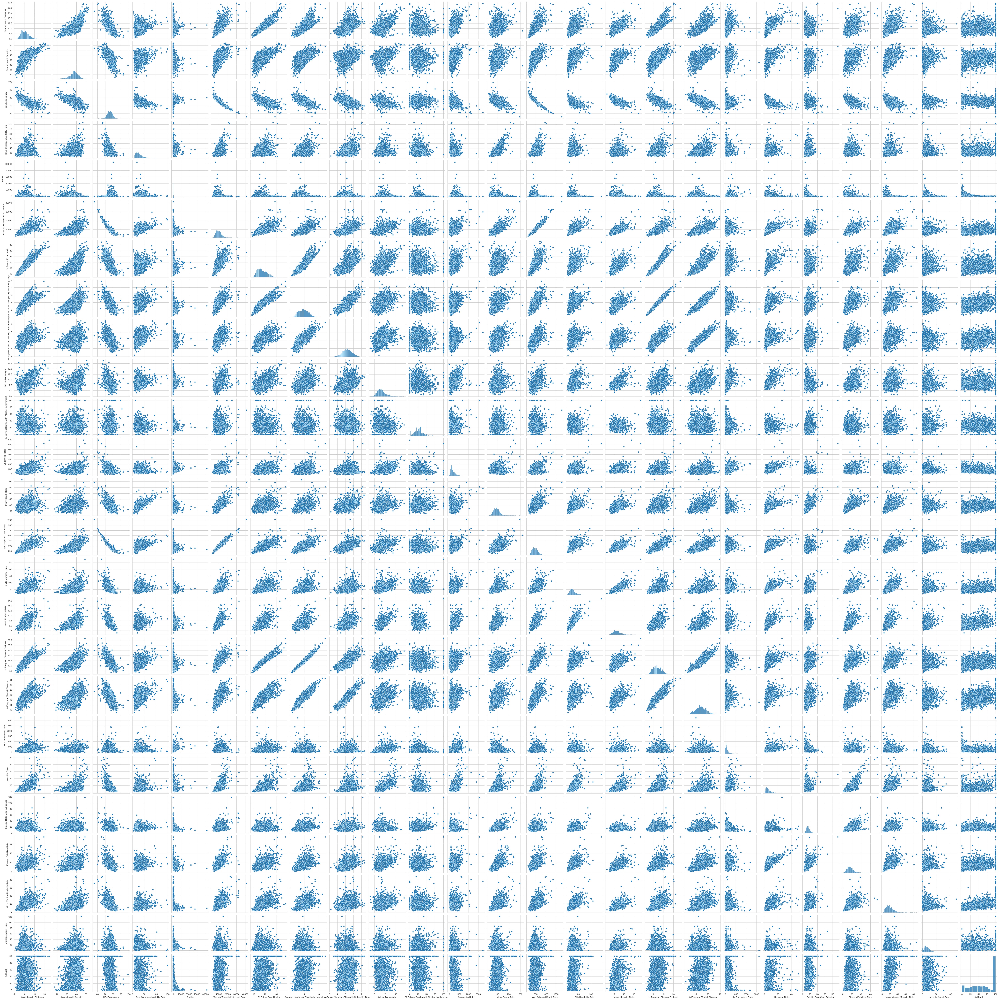

In [ ]:
# This took 2.5 minutes to run on a 10th gen intel macbook pro
# sns.pairplot(train_data_health_features)

In [43]:
train_data_health_features.describe()

,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Drug Overdose Mortality Rate,Deaths,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Driving Deaths with Alcohol Involvement,Chlamydia Rate,Injury Death Rate,Age-Adjusted Death Rate,Child Mortality Rate,Infant Mortality Rate,% Frequent Physical Distress,% Frequent Mental Distress,HIV Prevalence Rate,Homicide Rate,Suicide Rate (Age-Adjusted),Firearm Fatalities Rate,Motor Vehicle Mortality Rate,Juvenile Arrest Rate,% Rural
count,2513.000000,2513.000000,2455.000000,1524.000000,2309.000000,2309.000000,2513.00000,2513.000000,2513.000000,2436.000000,2489.000000,2402.000000,2428.000000,2469.000000,1629.000000,963.000000,2513.000000,2513.000000,2143.000000,1094.000000,1934.000000,1815.000000,2150.000000,1543.000000,2513.000000
mean,10.556825,37.350060,75.761101,29.348402,1603.583369,9964.088539,17.69029,3.894283,5.219279,8.342711,27.272025,388.912573,96.626977,475.004112,63.522564,6.632613,12.027895,17.139316,196.612086,7.686817,19.259300,17.188678,19.672259,17.988649,64.088881
std,2.248544,4.603612,3.489566,16.687952,4312.350782,3514.079708,4.52829,0.647124,0.613974,2.098362,15.286733,276.058869,29.117355,151.639615,25.751536,2.200299,2.165422,2.113141,216.527904,6.450476,7.794979,8.177036,9.771018,13.550839,33.816053
min,5.600000,17.400000,55.918958,4.859716,48.000000,2771.454704,8.40000,2.261790,3.185544,3.053435,0.000000,0.000000,26.625917,123.258695,21.765589,1.365055,6.600000,11.000000,0.000000,0.741225,4.959384,1.837715,2.561572,0.000000,0.000000
25%,8.900000,35.100000,73.570608,17.843538,259.000000,7554.532999,14.20000,3.390569,4.817079,6.917204,18.181818,213.325000,76.956991,369.288492,46.202791,5.104815,10.400000,15.700000,76.350000,3.579822,14.277447,11.749617,12.688044,8.964208,35.238295
50%,10.200000,37.700000,75.883111,25.509606,548.000000,9470.719807,16.90000,3.871491,5.235650,8.039625,26.190476,310.400000,93.816956,456.057229,58.742402,6.290159,11.900000,17.100000,133.300000,5.769378,17.984264,16.108896,18.015733,15.312500,67.097760
75%,11.800000,40.200000,78.053281,36.491599,1297.000000,11770.546180,20.80000,4.345849,5.637640,9.298281,33.333333,496.100000,111.778927,562.746757,74.262079,7.737155,13.500000,18.600000,240.350000,9.568762,22.566918,20.940559,24.830071,23.333333,100.000000
max,22.200000,52.500000,98.902938,148.510709,105949.000000,41152.261127,38.00000,6.836834,7.388805,18.795888,100.000000,3467.600000,315.568022,1785.770896,276.038511,18.474374,23.300000,24.700000,3230.200000,49.969859,118.517963,74.686198,87.773194,121.666667,100.000000


Possible outliers we may want to exclude:
- %Driving deaths with alcohol involvement max of 100% might not be useful
- Rates are likely per 100,000, or something along those lines

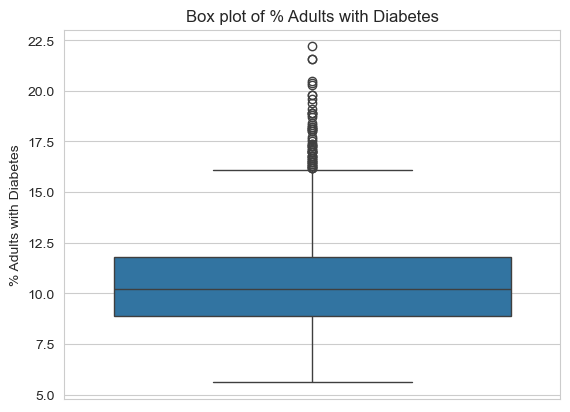

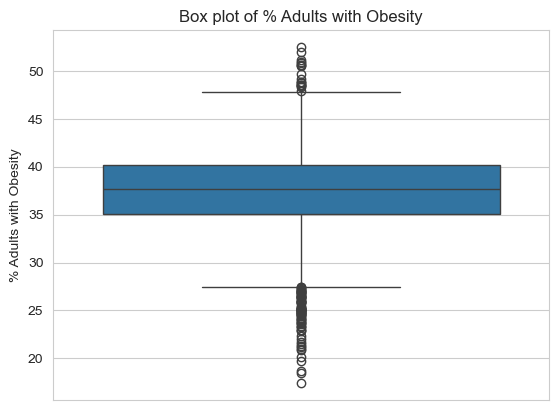

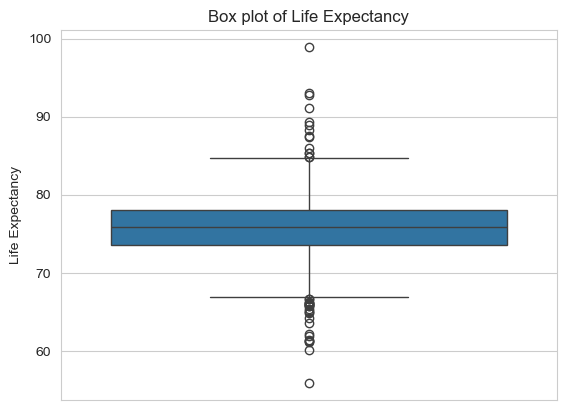

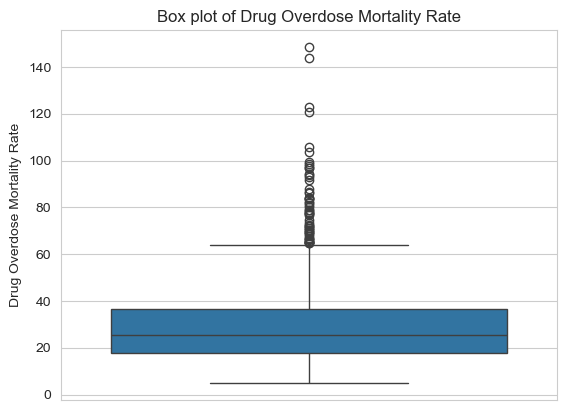

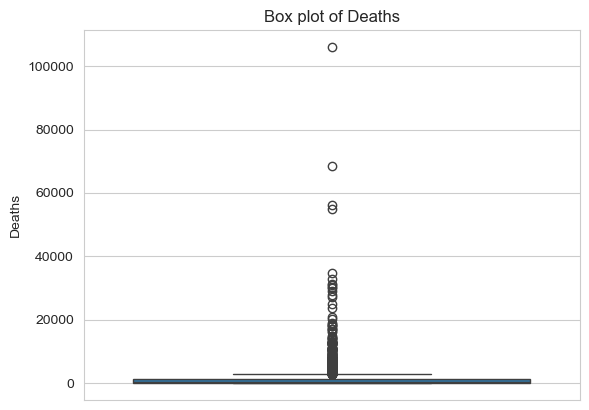

...

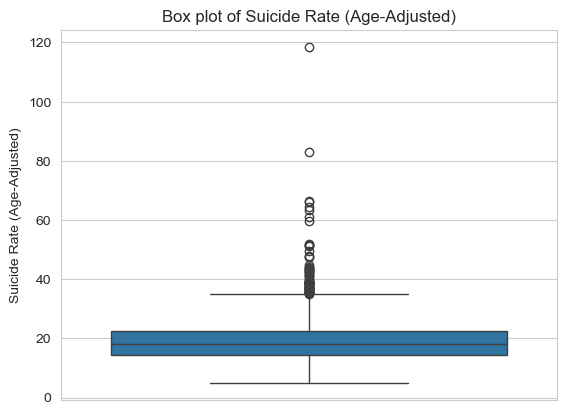

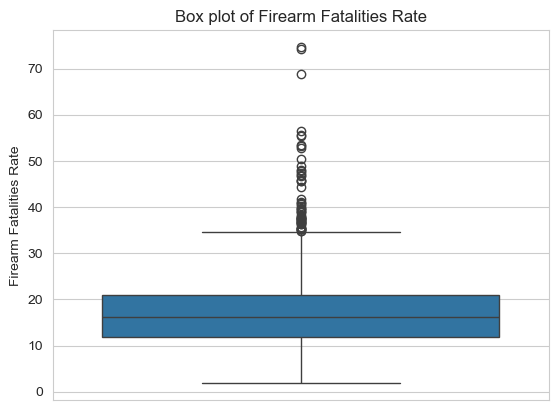

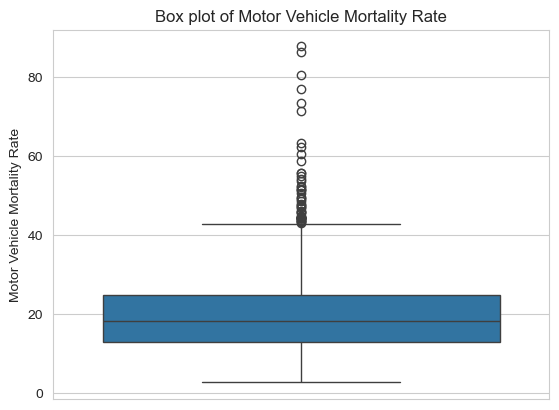

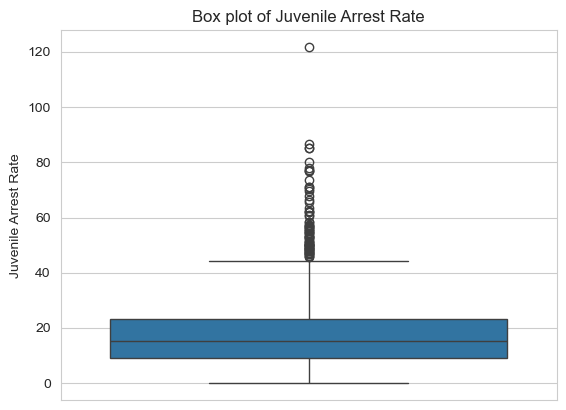

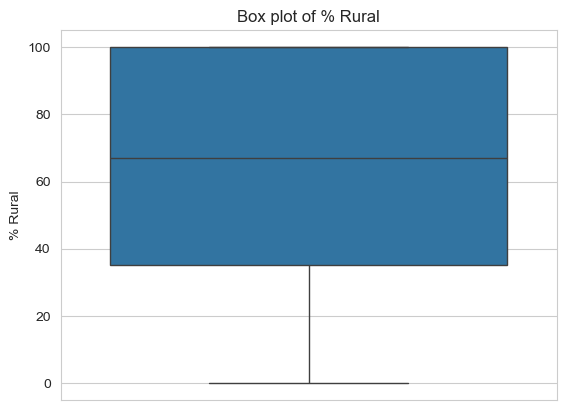

In [44]:
for feature in health_features:
    sns.boxplot(train_data_health_features, y=feature)
    plt.title(f'Box plot of {feature}')
    plt.show()

In [45]:
train_data_health_features.corr()

,% Adults with Diabetes,% Adults with Obesity,Life Expectancy,Drug Overdose Mortality Rate,Deaths,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Driving Deaths with Alcohol Involvement,Chlamydia Rate,Injury Death Rate,Age-Adjusted Death Rate,Child Mortality Rate,Infant Mortality Rate,% Frequent Physical Distress,% Frequent Mental Distress,HIV Prevalence Rate,Homicide Rate,Suicide Rate (Age-Adjusted),Firearm Fatalities Rate,Motor Vehicle Mortality Rate,Juvenile Arrest Rate,% Rural
% Adults with Diabetes,1.000000,0.683599,-0.732996,0.230855,-0.027215,0.739680,0.928419,0.776277,0.565029,0.618749,-0.082421,0.601827,0.330821,0.767817,0.601929,0.641511,0.836159,0.674547,0.408330,0.715685,0.082162,0.497534,0.548723,0.098530,0.118723
% Adults with Obesity,0.683599,1.000000,-0.650387,0.214382,-0.236132,0.583289,0.664557,0.585802,0.364079,0.330020,-0.014481,0.320836,0.288688,0.624795,0.495270,0.604075,0.623355,0.541841,0.045056,0.506852,0.101002,0.377049,0.474435,0.224062,0.306244
Life Expectancy,-0.732996,-0.650387,1.000000,-0.427444,0.142044,-0.934645,-0.761752,-0.749660,-0.623868,-0.515399,0.056314,-0.444065,-0.623566,-0.959009,-0.678868,-0.742174,-0.773001,-0.730194,-0.187254,-0.635329,-0.322988,-0.604437,-0.637799,-0.162756,-0.229373
Drug Overdose Mortality Rate,0.230855,0.214382,-0.427444,1.000000,0.030428,0.504833,0.277379,0.349405,0.392525,0.247703,-0.002485,-0.007489,0.713581,0.447429,0.218308,0.217242,0.339147,0.382645,0.095611,0.220603,0.116806,0.216149,0.156313,0.030866,0.117249
Deaths,-0.027215,-0.236132,0.142044,0.030428,1.000000,-0.121918,-0.093408,-0.146893,-0.072632,0.032820,-0.031445,0.157561,-0.122902,-0.132736,-0.153820,-0.161283,-0.147617,-0.159271,0.340080,-0.009989,-0.225934,-0.135483,-0.245506,-0.136668,-0.410917
Years of Potential Life Lost Rate,0.739680,0.583289,-0.934645,0.504833,-0.121918,1.000000,0.754099,0.722085,0.583961,0.546493,0.033154,0.498497,0.739181,0.967377,0.730671,0.754718,0.760011,0.689469,0.211114,0.694885,0.412784,0.678169,0.677436,0.145568,0.303092
% Fair or Poor Health,0.928419,0.664557,-0.761752,0.277379,-0.093408,0.754099,1.000000,0.916214,0.698548,0.562090,-0.080982,0.448500,0.400887,0.793886,0.613805,0.630888,0.951250,0.816477,0.271341,0.642115,0.204984,0.549580,0.602187,0.085281,0.224262
Average Number of Physically Unhealthy Days,0.776277,0.585802,-0.749660,0.349405,-0.146893,0.722085,0.916214,1.000000,0.848001,0.468761,-0.057590,0.286373,0.461753,0.762951,0.558863,0.587106,0.981018,0.930862,0.127278,0.474739,0.301707,0.525653,0.546552,0.088322,0.260221
Average Number of Mentally Unhealthy Days,0.565029,0.364079,-0.623868,0.392525,-0.072632,0.583961,0.698548,0.848001,1.000000,0.385099,-0.061176,0.180941,0.422281,0.619974,0.393236,0.423419,0.799697,0.929547,0.097301,0.317079,0.250844,0.428065,0.365260,0.030900,0.125524
% Low Birthweight,0.618749,0.330020,-0.515399,0.247703,0.032820,0.546493,0.562090,0.468761,0.385099,1.000000,-0.046232,0.495990,0.280279,0.546752,0.500242,0.621628,0.490079,0.425631,0.472824,0.702521,-0.027521,0.489900,0.316231,0.014107,-0.007197
